Cet ensemble de données contient une liste de jeux vidéo dont les ventes sont supérieures à 100 000 exemplaires.

Rang - Classement des ventes globales

Nom - Le nom du jeu

Plateforme - Plateforme de sortie du jeu (c'est-à-dire PC, PS4, etc.)

Année - Année de sortie du jeu

Genre - Genre du jeu

Éditeur - Éditeur du jeu

NA_Sales - Ventes en Amérique du Nord (en millions)

EU_Sales - Ventes en Europe (en millions)

JP_Sales - Ventes au Japon (en millions)

Other_Sales - Ventes dans le reste du monde (en millions)

Global_Sales - Ventes mondiales totales.

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [26]:
data= pd.read_csv('vgsales.csv')

In [27]:
data.shape

(16598, 11)

In [28]:
data.head()

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37


In [29]:
data.tail()

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
16593,16596,Woody Woodpecker in Crazy Castle 5,GBA,2002.0,Platform,Kemco,0.01,0.00,0.0,0.0,0.01
16594,16597,Men in Black II: Alien Escape,GC,2003.0,Shooter,Infogrames,0.01,0.00,0.0,0.0,0.01
16595,16598,SCORE International Baja 1000: The Official Game,PS2,2008.0,Racing,Activision,0.00,0.00,0.0,0.0,0.01
16596,16599,Know How 2,DS,2010.0,Puzzle,7G//AMES,0.00,0.01,0.0,0.0,0.01
16597,16600,Spirits & Spells,GBA,2003.0,Platform,Wanadoo,0.01,0.00,0.0,0.0,0.01


In [30]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16598 entries, 0 to 16597
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Rank          16598 non-null  int64  
 1   Name          16598 non-null  object 
 2   Platform      16598 non-null  object 
 3   Year          16327 non-null  float64
 4   Genre         16598 non-null  object 
 5   Publisher     16540 non-null  object 
 6   NA_Sales      16598 non-null  float64
 7   EU_Sales      16598 non-null  float64
 8   JP_Sales      16598 non-null  float64
 9   Other_Sales   16598 non-null  float64
 10  Global_Sales  16598 non-null  float64
dtypes: float64(6), int64(1), object(4)
memory usage: 1.4+ MB


In [31]:
# Convertir year to date
data['Year'] = pd.to_datetime(data['Year'], format='%Y')

In [32]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16598 entries, 0 to 16597
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Rank          16598 non-null  int64         
 1   Name          16598 non-null  object        
 2   Platform      16598 non-null  object        
 3   Year          16327 non-null  datetime64[ns]
 4   Genre         16598 non-null  object        
 5   Publisher     16540 non-null  object        
 6   NA_Sales      16598 non-null  float64       
 7   EU_Sales      16598 non-null  float64       
 8   JP_Sales      16598 non-null  float64       
 9   Other_Sales   16598 non-null  float64       
 10  Global_Sales  16598 non-null  float64       
dtypes: datetime64[ns](1), float64(5), int64(1), object(4)
memory usage: 1.4+ MB


In [33]:
# Missing values
data.isnull().mean()*100

Rank            0.000000
Name            0.000000
Platform        0.000000
Year            1.632727
Genre           0.000000
Publisher       0.349440
NA_Sales        0.000000
EU_Sales        0.000000
JP_Sales        0.000000
Other_Sales     0.000000
Global_Sales    0.000000
dtype: float64

In [34]:
# Supprimer les missing values
data.dropna(inplace=True)

In [35]:
# Missing values
data.isnull().mean()*100

Rank            0.0
Name            0.0
Platform        0.0
Year            0.0
Genre           0.0
Publisher       0.0
NA_Sales        0.0
EU_Sales        0.0
JP_Sales        0.0
Other_Sales     0.0
Global_Sales    0.0
dtype: float64

In [36]:
data.duplicated().sum()

0

Analyse Univariée

In [37]:
data.columns

Index(['Rank', 'Name', 'Platform', 'Year', 'Genre', 'Publisher', 'NA_Sales',
       'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales'],
      dtype='object')

Platform
DS      2131
PS2     2127
PS3     1304
Wii     1290
X360    1234
PSP     1197
PS      1189
PC       938
XB       803
GBA      786
GC       542
3DS      499
PSV      410
PS4      336
N64      316
SNES     239
XOne     213
SAT      173
WiiU     143
2600     116
NES       98
GB        97
DC        52
GEN       27
NG        12
SCD        6
WS         6
3DO        3
TG16       2
GG         1
PCFX       1
Name: count, dtype: int64


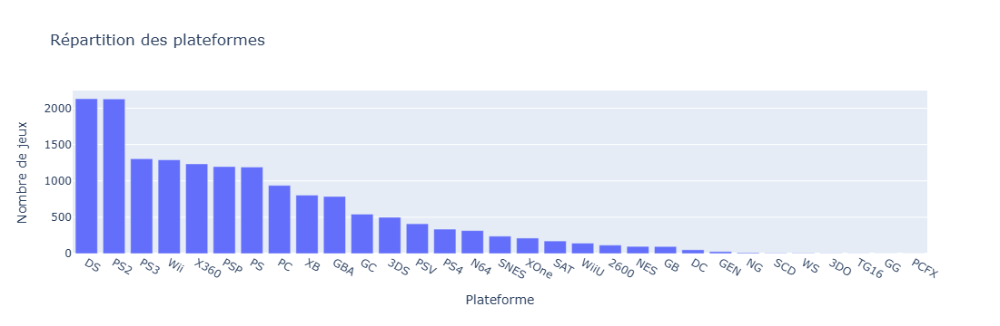

In [38]:
platform_values = data['Platform'].value_counts()
print(platform_values)

# Compter les occurrences de chaque plateforme
platform_counts = data['Platform'].value_counts().reset_index()
platform_counts.columns = ['Platform', 'Count']

# Créer un graphique en barres
fig = px.bar(platform_counts, x='Platform', y='Count',
             title='Répartition des plateformes',
             labels={'Platform': 'Plateforme', 'Count': 'Nombre de jeux'})
fig.show()

Les plateformes les plus populaires en termes de nombre de jeux sont la DS et
la PS2, avec plus de 2000 jeux chacune.
Les plateformes comme la PS3, la Wii, la X360, et la PSP suivent avec un nombre de jeux plus réduit, mais toujours significatif, entre 1000 et 1500 jeux.
Vers la droite du graphique, des consoles moins populaires comme la WiiU, la 2600, et la NES ont un nombre beaucoup plus faible de jeux.
Enfin, certaines plateformes comme la PCFX et la TG16 ont très peu de jeux répertoriés.

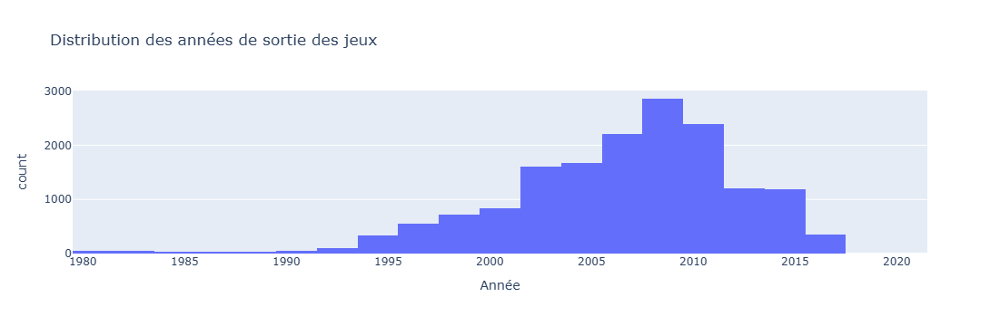

In [39]:
# Créer un histogramme pour les années de sortie
fig = px.histogram(data, x='Year', nbins=30,
                   title='Distribution des années de sortie des jeux',
                   labels={'Year': 'Année'})
fig.show()

Cela indique une forte croissance de l'industrie des jeux vidéo durant les années 2000, avant de ralentir à partir des années 2010.

Genre
Action          3251
Sports          2304
Misc            1686
Role-Playing    1470
Shooter         1282
Adventure       1274
Racing          1225
Platform         875
Simulation       848
Fighting         836
Strategy         670
Puzzle           570
Name: count, dtype: int64


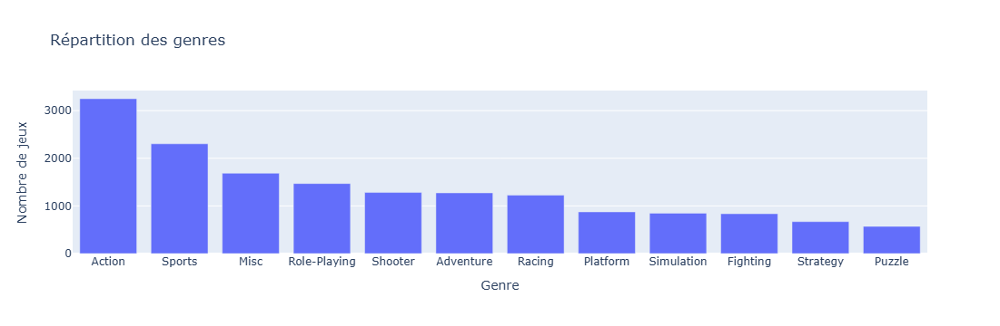

In [40]:
genre_values = data['Genre'].value_counts()
print(genre_values)

# Compter les occurrences de chaque genre
genre_counts = data['Genre'].value_counts().reset_index()
genre_counts.columns = ['Genre', 'Count']

# Créer un graphique en barres
fig = px.bar(genre_counts, x='Genre', y='Count',
             title='Répartition des genres',
             labels={'Genre': 'Genre', 'Count': 'Nombre de jeux'})
fig.show()

On constate que le genre "Action" est le plus représenté, avec plus de 3000 jeux, suivi des genres "Sports" et "Misc" qui comptent chacun plus de 2000 jeux. Les genres tels que "Role-Playing", "Shooter", "Adventure", et "Racing" sont également bien représentés avec environ 1500 à 2000 jeux chacun. Les genres "Puzzle" et "Strategy" sont les moins populaires avec moins de 1000 jeux. Cela suggère une forte préférence pour les genres d'action et de sport dans l'industrie des jeux vidéo.

Publisher
Electronic Arts                 1339
Activision                       966
Namco Bandai Games               928
Ubisoft                          918
Konami Digital Entertainment     823
                                ... 
Detn8 Games                        1
Pow                                1
Navarre Corp                       1
MediaQuest                         1
UIG Entertainment                  1
Name: count, Length: 576, dtype: int64


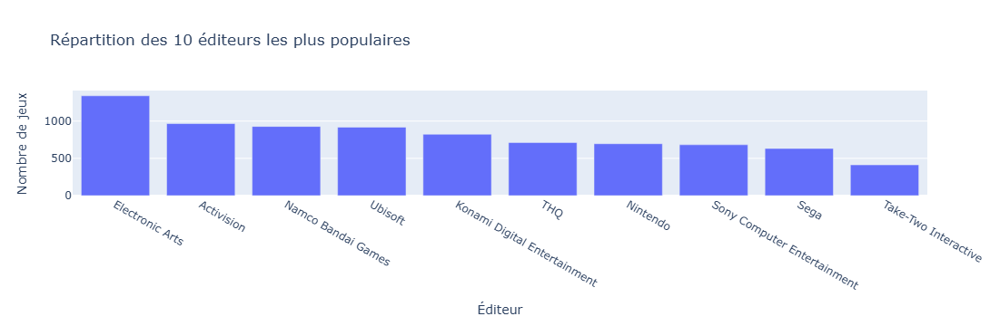

In [41]:
publisher_values = data['Publisher'].value_counts()
print(publisher_values)

# Compter les occurrences des éditeurs (limité aux 10 premiers)
publisher_counts = data['Publisher'].value_counts().reset_index().head(10)
publisher_counts.columns = ['Publisher', 'Count']

# Créer un graphique en barres
fig = px.bar(publisher_counts, x='Publisher', y='Count',
             title='Répartition des 10 éditeurs les plus populaires',
             labels={'Publisher': 'Éditeur', 'Count': 'Nombre de jeux'})
fig.show()

le graphique montre la répartition des 10 éditeurs de jeux vidéo les plus populaires en fonction du nombre de jeux publiés. En tête, Electronic Arts domine avec environ 1400 jeux, suivi par Activision et Namco Bandai Games, qui ont publié un peu plus de 1000 jeux chacun. Ubisoft, Konami et THQ se situent juste en dessous, avec environ 900 à 1000 jeux. Nintendo, Sony et Sega ont publié entre 800 et 900 jeux. Enfin, Take-Two Interactive ferme la marche avec moins de 600 jeux.

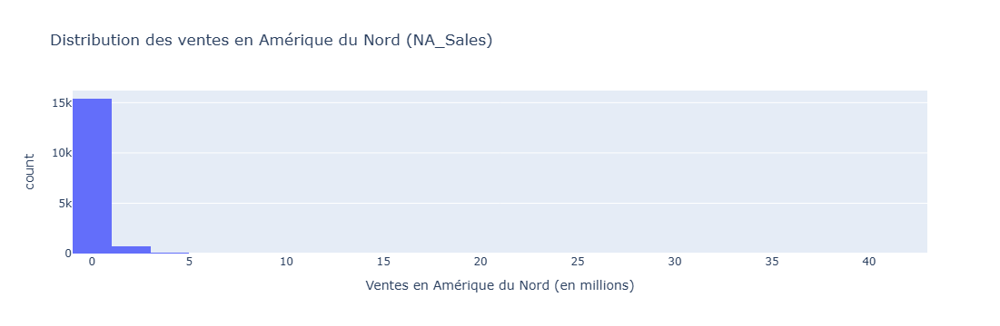

In [42]:
# Créer un histogramme pour les ventes en Amérique du Nord
fig = px.histogram(data, x='NA_Sales', nbins=30,
                   title='Distribution des ventes en Amérique du Nord (NA_Sales)',
                   labels={'NA_Sales': 'Ventes en Amérique du Nord (en millions)'})
fig.show()

La majorité des jeux (environ 15 000) ont des ventes inférieures à 5 millions.
Très peu de jeux dépassent les 5 millions de ventes, avec encore moins atteignant des chiffres entre 20 et 40 millions.
Les ventes supérieures à 40 millions sont extrêmement rares.

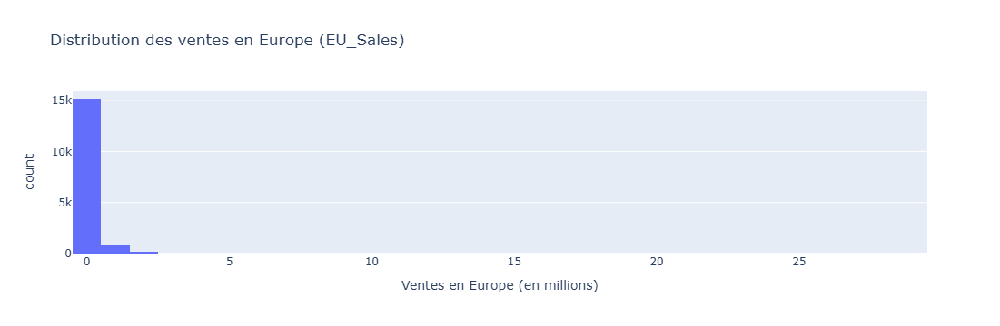

In [43]:
# Créer un histogramme pour les ventes en Europe
fig = px.histogram(data, x='EU_Sales', nbins=30,
                   title='Distribution des ventes en Europe (EU_Sales)',
                   labels={'EU_Sales': 'Ventes en Europe (en millions)'})
fig.show()

==> La majorité des jeux vidéo en Europe (environ 15 000) ont des ventes inférieures à 1 million d’exemplaires. Très peu de jeux dépassent 5 millions de ventes, et encore moins atteignent des chiffres supérieurs à 10 millions. Les ventes exceptionnelles au-delà de 20 millions sont extrêmement rares, indiquant une distribution très concentrée sur les faibles ventes, avec seulement quelques titres phares réalisant des chiffres records.

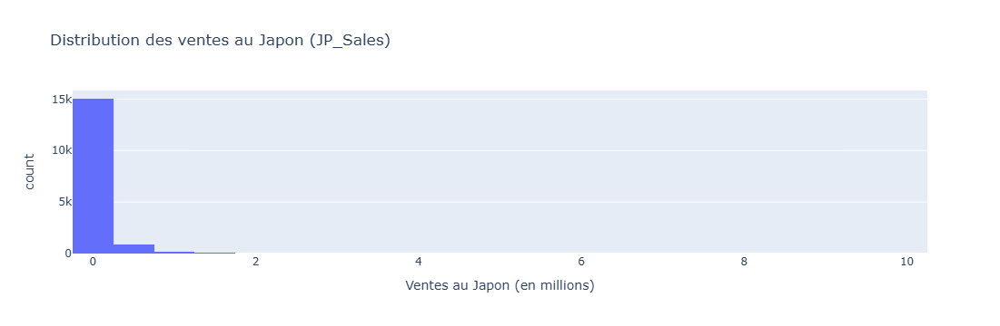

In [44]:
# Créer un histogramme pour les ventes au Japon
fig = px.histogram(data, x='JP_Sales', nbins=30,
                   title='Distribution des ventes au Japon (JP_Sales)',
                   labels={'JP_Sales': 'Ventes au Japon (en millions)'})
fig.show()

==> La majorité des jeux vidéo au Japon (environ 15 000) enregistrent des ventes inférieures à 1 million d’exemplaires. Très peu dépassent ce seuil, et les jeux atteignant 2 millions de ventes ou plus sont rares. Les ventes exceptionnelles supérieures à 5 millions sont extrêmement limitées, indiquant que le marché japonais est très concentré sur des ventes modestes, avec seulement quelques titres atteignant des chiffres élevés.

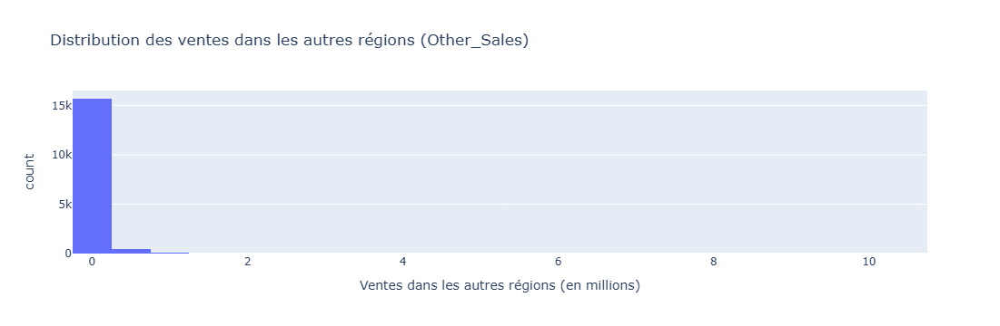

In [45]:
# Créer un histogramme pour les ventes dans les autres régions
fig = px.histogram(data, x='Other_Sales', nbins=30,
                   title='Distribution des ventes dans les autres régions (Other_Sales)',
                   labels={'Other_Sales': 'Ventes dans les autres régions (en millions)'})
fig.show()

==> La grande majorité des jeux dans les autres régions réalisent des ventes inférieures à 1 million d’exemplaires, avec environ 15 000 jeux dans cette tranche. Très peu de jeux dépassent 1 million de ventes, et ceux atteignant 2 millions ou plus sont extrêmement rares. Cela indique que les marchés en dehors du Japon, de l’Amérique du Nord et de l’Europe sont relativement moins porteurs en termes de ventes massives, avec seulement quelques titres enregistrant des chiffres significatifs.

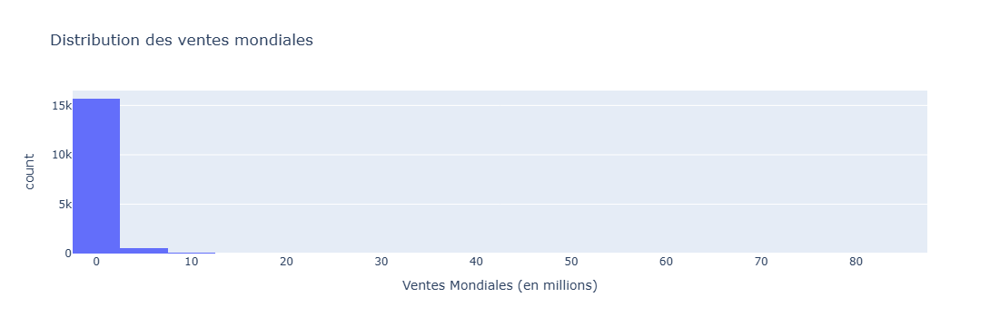

In [46]:
# Créer un histogramme pour les ventes mondiales
fig = px.histogram(data, x='Global_Sales', nbins=30,
                   title='Distribution des ventes mondiales',
                   labels={'Global_Sales': 'Ventes Mondiales (en millions)'})
fig.show()

Analyse Bivarriée

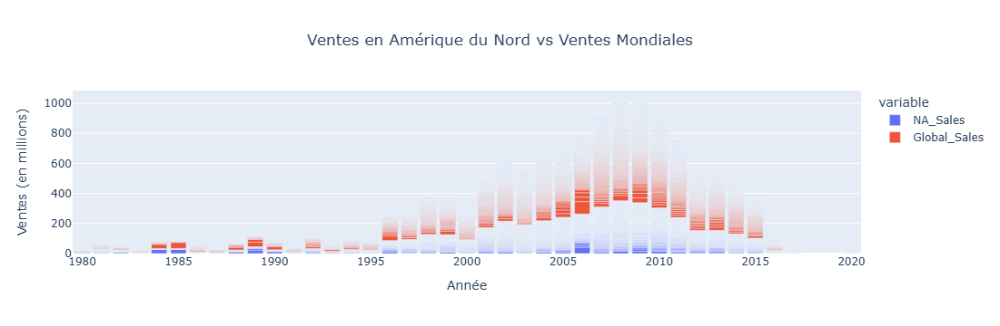

In [47]:
# Bar chart pour NA_Sales vs Global_Sales
fig1 = px.bar(data, x='Year', y=['NA_Sales', 'Global_Sales'],
              title='Ventes en Amérique du Nord vs Ventes Mondiales',
              labels={'value': 'Ventes (en millions)', 'Year': 'Année'})
fig1.update_layout(title_x=0.5)
fig1.show()


Le graphique montre l'évolution des ventes de jeux vidéo en Amérique du Nord comparées aux ventes mondiales entre 1980 et 2020. Après une faible croissance jusqu'en 1995, les ventes augmentent fortement, atteignant un pic entre 2005 et 2010, où les ventes mondiales dépassent largement celles d'Amérique du Nord. Après 2010, les ventes commencent à diminuer progressivement, tout en restant nettement plus élevées à l'échelle mondiale qu'en Amérique du Nord.

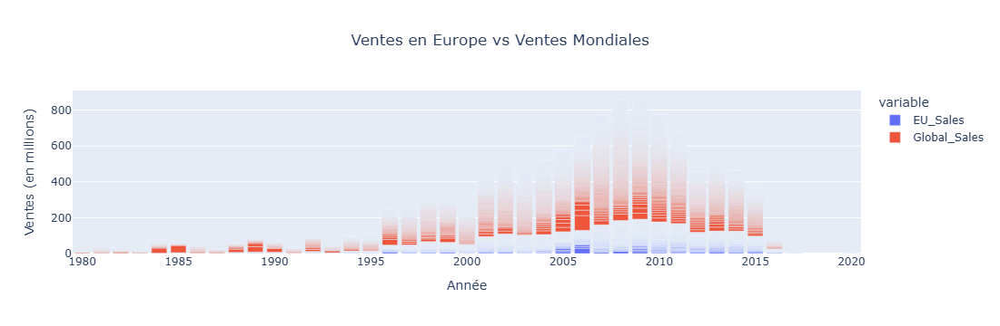

In [48]:
# Bar chart pour EU_Sales vs Global_Sales
fig2 = px.bar(data, x='Year', y=['EU_Sales', 'Global_Sales'],
              title='Ventes en Europe vs Ventes Mondiales',
              labels={'value': 'Ventes (en millions)', 'Year': 'Année'})
fig2.update_layout(title_x=0.5)
fig2.show()

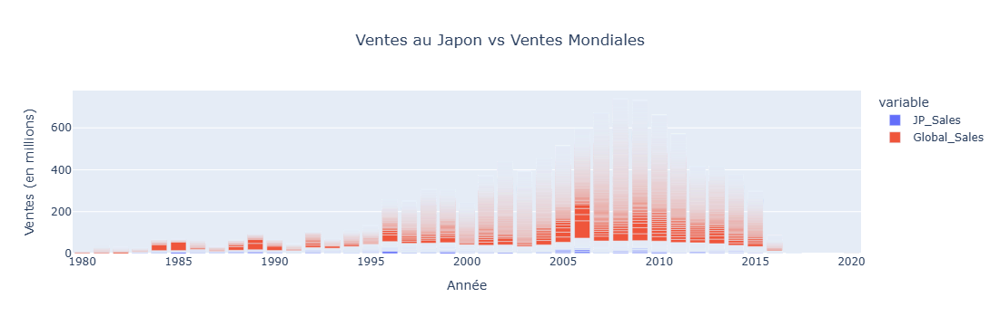

In [49]:
# Bar chart pour JP_Sales vs Global_Sales
fig3 = px.bar(data, x='Year', y=['JP_Sales', 'Global_Sales'],
              title='Ventes au Japon vs Ventes Mondiales',
              labels={'value': 'Ventes (en millions)', 'Year': 'Année'})
fig3.update_layout(title_x=0.5)
fig3.show()

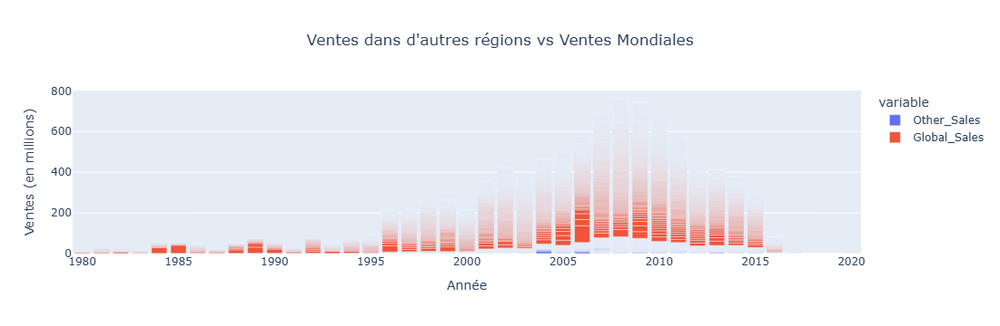

In [50]:
# Bar chart pour Other_Sales vs Global_Sales
fig4 = px.bar(data, x='Year', y=['Other_Sales', 'Global_Sales'],
              title='Ventes dans d\'autres régions vs Ventes Mondiales',
              labels={'value': 'Ventes (en millions)', 'Year': 'Année'})
fig4.update_layout(title_x=0.5)
fig4.show()

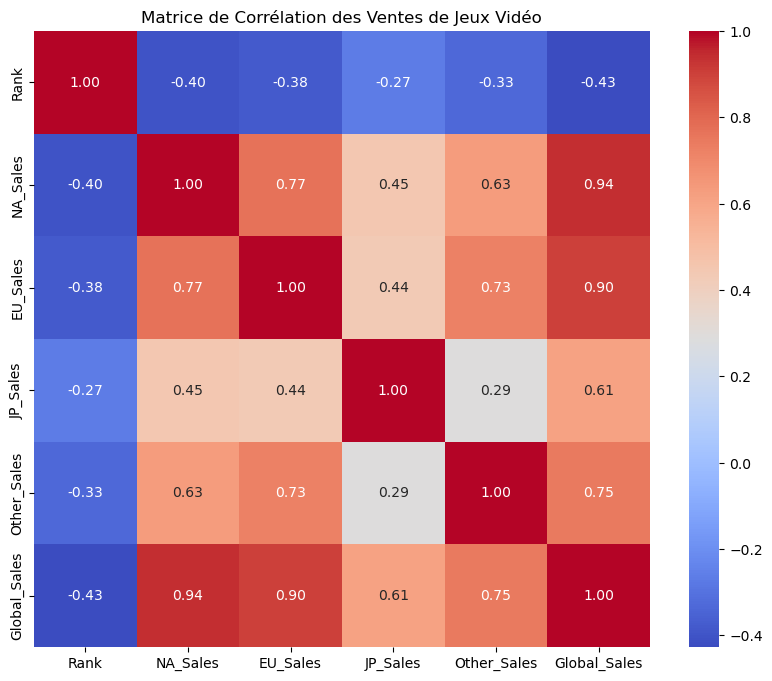

In [61]:
# Calculer la matrice de corrélation pour les colonnes numériques seulement
correlation_matrix = data.select_dtypes(include=np.number).corr()

# Créer la heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Matrice de Corrélation des Ventes de Jeux Vidéo')
plt.show()